### Plant Disease Detection Using CNN

Import Libraries

In [172]:
!pip install visualkeras
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import numpy as np
import visualkeras
from PIL import ImageFont

Python(12256) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Setting the Global variables for comfortability

In [173]:
# Image_size variable you want use it for the kind of size of the image you wanted from the dataset.
Image_Size = 256
# Batch Size is used to take at data in the form of batches as mentioned below our code will take 32 images at a time.
Batch_Size = 32
# The channels is used for as we have RGB images we set the Channels value to 3.
Channels = 3
# The number of epochs is the number of rounds performed to train the model.
Epochs = 50

Getting all the data with help of tensorflow

In [174]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "Plant_Disease_Dataset", batch_size = Batch_Size, image_size = (Image_Size, Image_Size), shuffle = True) 

Found 20638 files belonging to 15 classes.


Classes Present in the Dataset

In [175]:
class_names = dataset.class_names

In [176]:
print(class_names) #There are 15 classes in the directory you will be able to see all of those listed in a list

['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy']


The number shown above will confuse you but if you multiply **1698 x [batchsize] i.e 32** then we will be able to get the value i.e. **54336** and our data is have **54305** the last batch will have less images

Plotting a Batch

2024-05-10 09:17:00.166775: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


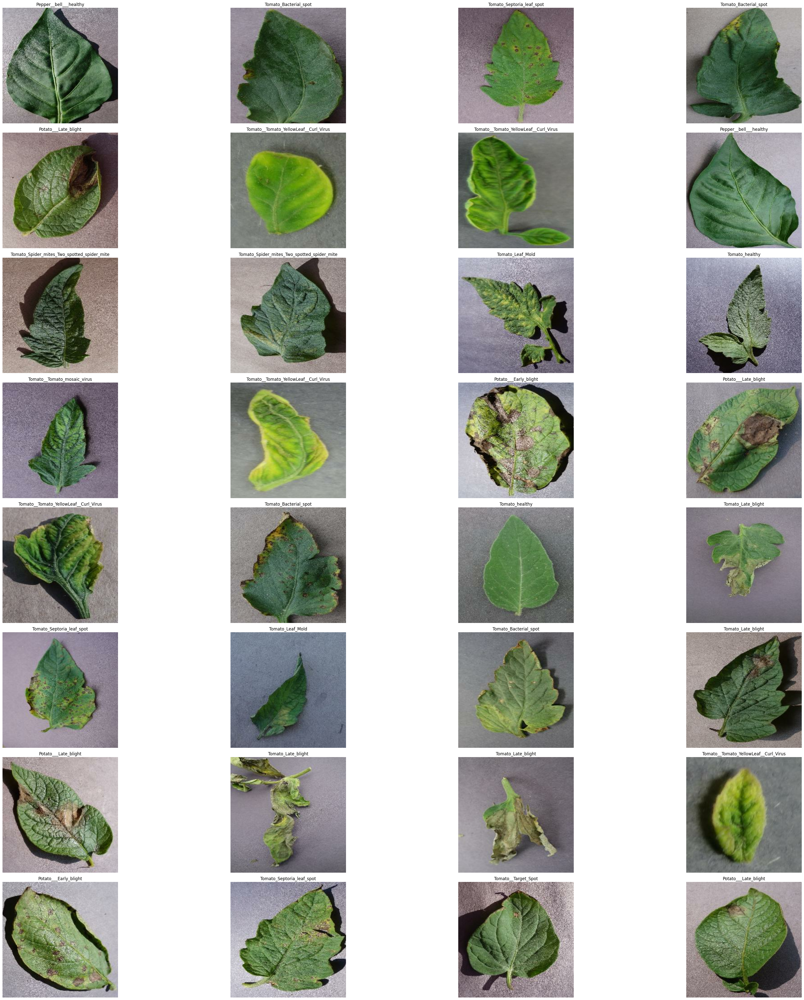

In [177]:
fig = plt.figure(figsize=(40, 40))

for i, (image, label) in enumerate(dataset.take(1)):
    for j in range(32):
        ax = fig.add_subplot(8, 4, i * 32 + j + 1)
        ax.imshow(image[j].numpy().astype('uint8'))
        ax.set_title(class_names[label[j]])
        ax.axis('off')

plt.tight_layout()
plt.show()


Function for splitting the data in to Training Testing and Validation Data 

In [127]:
def train_test_val_split(data, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    """
    Split the dataset into training, validation, and test sets.

    Parameters:
        data (tf.data.Dataset): Input dataset.
        train_split (float): Fraction of data to be used for training.
        val_split (float): Fraction of data to be used for validation.
        test_split (float): Fraction of data to be used for testing.
        shuffle (bool): Whether to shuffle the data before splitting.
        shuffle_size (int): Buffer size for shuffling.

    Returns:
        tuple: Three tf.data.Dataset objects for training, validation, and testing.
    """
    # Shuffle the dataset if specified
    if shuffle:
        data = data.shuffle(shuffle_size, seed=10)
    
    # Get the size of the dataset
    dataset_size = len(data)
    
    # Calculate sizes for training, validation, and test sets
    train_size = int(train_split * dataset_size)
    val_size = int(val_split * dataset_size)
    test_size = int(test_split * dataset_size)
    
    # Split the dataset into training, validation, and test sets
    train_dataset = data.take(train_size)
    val_dataset = data.skip(train_size).take(val_size)
    test_dataset = data.skip(train_size + val_size)
    
    return train_dataset, val_dataset, test_dataset

In [128]:
train_data, val_data, test_data = train_test_val_split(dataset)

In [129]:
print("Data Size :{0} \nBatch size for Training Data is :{1}\nBatch size for Testing Data is :{2}\nBatch size for Validation Data is :{3} " .format(len(dataset), len(train_data), len(test_data), len(val_data)))

Data Size :645 
Batch size for Training Data is :516
Batch size for Testing Data is :65
Batch size for Validation Data is :64 


As Prefetching for datasets overlaps preprocessing and model execution

In [130]:
train_dataset = train_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)
val_dataset = val_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)
test_dataset = test_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)

If the image values are different the we Normalize the data By making all the images of same sizes and Rescaling it to bring all the value in between 0 and 1 

In [131]:
Image_Size = 100  # Replace with your desired image size

resize_rescale = tf.keras.Sequential([
    layers.Resizing(Image_Size, Image_Size),
    layers.Rescaling(1.0/255)
])

We tried using our model without data augmentation it is generating low accuracy and because of which we did data augmentation so that the classes which have less images will get trained properly and that helped us achive better results

In [132]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip(mode="horizontal_and_vertical"),
    layers.RandomRotation(factor=0.5)
])

Our CNN Architecture

In [133]:
# Input shape
input_shape = (Batch_Size, Image_Size, Image_Size, Channels)

# Define the model
model = models.Sequential([
    resize_rescale,
    data_augmentation,
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(class_names), activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

/Users/ankithas/589_venv/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [134]:
model.build(input_shape = input_shape)

In [135]:
model.summary()

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_20 (Sequential)      │ (32, 100, 100, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_21 (Sequential)      │ (32, 100, 100, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_56 (Conv2D)              │ (32, 98, 98, 32)       │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (32, 49, 49, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (32, 47, 47, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_57 (MaxPooling2D) │ (32, 23, 23, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (32, 21, 21, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_58 (MaxPooling2D) │ (32, 10, 10, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (32, 8, 8, 128)        │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_59 (MaxPooling2D) │ (32, 4, 4, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (32, 2048)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (32, 128)              │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (32, 15)               │         1,935 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 505,039 (1.93 MB)

 Trainable params: 505,039 (1.93 MB)

 Non-trainable params: 0 (0.00 B)

Visualization of Architecture

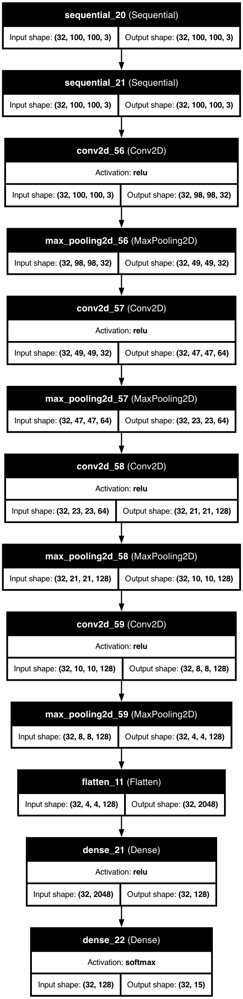

In [136]:
tf.keras.utils.plot_model(
model,
to_file="model.png",
show_shapes=True,
show_dtype=False,
show_layer_names=True,
rankdir="TB",
expand_nested=True,
dpi=96,
layer_range=None,
show_layer_activations=True,
)

In [137]:
model.compile(
    optimizer = 'adam', 
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = False), 
    metrics = ['accuracy'])

Run the Model

In [138]:
model_history = model.fit(
train_data, epochs = Epochs, batch_size = Batch_Size, verbose = 'auto', validation_data = val_data)

Epoch 1/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - accuracy: 0.2533 - loss: 2.2533

2024-05-10 01:29:34.130384: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 632 of 10000
2024-05-10 01:29:34.699117: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 173s 315ms/step - accuracy: 0.2536 - loss: 2.2526 - val_accuracy: 0.5557 - val_loss: 1.3641
Epoch 2/50


2024-05-10 01:29:50.908474: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 588 of 10000
2024-05-10 01:29:54.518865: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - accuracy: 0.6555 - loss: 1.0412

2024-05-10 01:32:42.350015: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 521 of 10000
2024-05-10 01:32:45.500134: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 192s 341ms/step - accuracy: 0.6556 - loss: 1.0410 - val_accuracy: 0.6216 - val_loss: 1.1607
Epoch 3/50


2024-05-10 01:33:03.024961: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 542 of 10000
2024-05-10 01:33:30.731832: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 560 of 10000
2024-05-10 01:33:43.668832: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 574 of 10000
2024-05-10 01:34:02.978118: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step - accuracy: 0.7458 - loss: 0.7342

2024-05-10 01:38:33.093065: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 533 of 10000
2024-05-10 01:38:36.098494: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 349s 516ms/step - accuracy: 0.7458 - loss: 0.7341 - val_accuracy: 0.6774 - val_loss: 1.0466
Epoch 4/50


2024-05-10 01:38:51.903874: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 626 of 10000
2024-05-10 01:38:52.431117: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - accuracy: 0.7970 - loss: 0.5888

2024-05-10 01:41:35.207488: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 591 of 10000
2024-05-10 01:41:36.456990: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 181s 330ms/step - accuracy: 0.7970 - loss: 0.5888 - val_accuracy: 0.8018 - val_loss: 0.5690
Epoch 5/50


2024-05-10 01:41:53.398745: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 585 of 10000
2024-05-10 01:41:55.652340: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step - accuracy: 0.8277 - loss: 0.5052

2024-05-10 01:44:40.130868: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 639 of 10000
2024-05-10 01:44:40.473272: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 185s 333ms/step - accuracy: 0.8277 - loss: 0.5051 - val_accuracy: 0.7881 - val_loss: 0.6377
Epoch 6/50


2024-05-10 01:44:57.633110: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 593 of 10000
2024-05-10 01:44:59.074956: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 604ms/step - accuracy: 0.8531 - loss: 0.4225

2024-05-10 01:50:20.466375: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 635 of 10000
2024-05-10 01:50:20.813390: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 340s 638ms/step - accuracy: 0.8532 - loss: 0.4225 - val_accuracy: 0.8511 - val_loss: 0.4180
Epoch 7/50


2024-05-10 01:50:37.690720: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 563 of 10000
2024-05-10 01:50:39.743795: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step - accuracy: 0.8739 - loss: 0.3685

2024-05-10 01:53:50.005545: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 133 of 10000
2024-05-10 01:54:01.076679: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 194 of 10000
2024-05-10 01:54:20.358858: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 322 of 10000
2024-05-10 01:54:32.208433: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 387 of 10000
2024-05-10 01:54:50.944711: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 400 of 10000
2024-05-10 01:55:09.118265: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this 

516/516 ━━━━━━━━━━━━━━━━━━━━ 349s 654ms/step - accuracy: 0.8739 - loss: 0.3685 - val_accuracy: 0.8501 - val_loss: 0.4583
Epoch 8/50


2024-05-10 01:56:26.933689: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 587 of 10000
2024-05-10 01:56:28.367256: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step - accuracy: 0.8818 - loss: 0.3418

2024-05-10 01:59:12.994745: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 603 of 10000
2024-05-10 01:59:13.971866: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 184s 334ms/step - accuracy: 0.8818 - loss: 0.3418 - val_accuracy: 0.8672 - val_loss: 0.3890
Epoch 9/50


2024-05-10 01:59:30.810413: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 607 of 10000
2024-05-10 01:59:31.878464: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step - accuracy: 0.8886 - loss: 0.3050

2024-05-10 02:02:17.547706: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 628 of 10000
2024-05-10 02:02:18.000000: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 184s 335ms/step - accuracy: 0.8886 - loss: 0.3050 - val_accuracy: 0.8018 - val_loss: 0.5671
Epoch 10/50


2024-05-10 02:02:34.828353: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 622 of 10000


  1/516 ━━━━━━━━━━━━━━━━━━━━ 1:36:56 11s/step - accuracy: 0.8750 - loss: 0.3103

2024-05-10 02:02:35.663433: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - accuracy: 0.8967 - loss: 0.3011

2024-05-10 02:05:24.877262: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 605 of 10000
2024-05-10 02:05:25.907067: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 188s 343ms/step - accuracy: 0.8967 - loss: 0.3011 - val_accuracy: 0.8018 - val_loss: 0.6240
Epoch 11/50


2024-05-10 02:05:42.615228: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 627 of 10000
2024-05-10 02:05:43.263110: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - accuracy: 0.9073 - loss: 0.2686

2024-05-10 02:08:27.778469: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 617 of 10000
2024-05-10 02:08:28.264567: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 183s 334ms/step - accuracy: 0.9073 - loss: 0.2686 - val_accuracy: 0.8965 - val_loss: 0.2793
Epoch 12/50


2024-05-10 02:08:45.507650: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 590 of 10000
2024-05-10 02:08:46.744942: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step - accuracy: 0.9142 - loss: 0.2515

2024-05-10 02:11:29.948136: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 595 of 10000
2024-05-10 02:11:31.293751: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 183s 333ms/step - accuracy: 0.9142 - loss: 0.2515 - val_accuracy: 0.9272 - val_loss: 0.2089
Epoch 13/50


2024-05-10 02:11:48.353198: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 611 of 10000
2024-05-10 02:11:49.294571: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step - accuracy: 0.9208 - loss: 0.2180

2024-05-10 02:14:32.580489: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 631 of 10000
2024-05-10 02:14:32.799223: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 182s 329ms/step - accuracy: 0.9208 - loss: 0.2180 - val_accuracy: 0.8887 - val_loss: 0.3305
Epoch 14/50


2024-05-10 02:14:50.001939: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 597 of 10000
2024-05-10 02:14:51.114916: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step - accuracy: 0.9223 - loss: 0.2275

2024-05-10 02:17:35.275804: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 621 of 10000
2024-05-10 02:17:36.151445: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 183s 334ms/step - accuracy: 0.9223 - loss: 0.2275 - val_accuracy: 0.8770 - val_loss: 0.3726
Epoch 15/50


2024-05-10 02:17:53.299839: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 631 of 10000


  1/516 ━━━━━━━━━━━━━━━━━━━━ 1:30:54 11s/step - accuracy: 0.8750 - loss: 0.2003

2024-05-10 02:17:53.650732: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - accuracy: 0.9292 - loss: 0.2037

2024-05-10 02:20:38.552220: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 638 of 10000
2024-05-10 02:20:38.617121: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 183s 334ms/step - accuracy: 0.9292 - loss: 0.2037 - val_accuracy: 0.8765 - val_loss: 0.3457
Epoch 16/50


2024-05-10 02:20:56.274001: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 542 of 10000
2024-05-10 02:20:59.328428: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9316 - loss: 0.1934

2024-05-10 02:23:40.326576: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 616 of 10000
2024-05-10 02:23:41.108682: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 183s 328ms/step - accuracy: 0.9316 - loss: 0.1934 - val_accuracy: 0.9023 - val_loss: 0.2724
Epoch 17/50


2024-05-10 02:23:58.656983: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 610 of 10000
2024-05-10 02:23:59.791019: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 172s 312ms/step - accuracy: 0.9327 - loss: 0.1868 - val_accuracy: 0.8936 - val_loss: 0.2829
Epoch 18/50


2024-05-10 02:26:50.915919: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 644 of 10000
2024-05-10 02:26:50.925661: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9439 - loss: 0.1597

2024-05-10 02:29:21.141890: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 579 of 10000
2024-05-10 02:29:22.889849: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 169s 307ms/step - accuracy: 0.9439 - loss: 0.1598 - val_accuracy: 0.9253 - val_loss: 0.2152
Epoch 19/50


2024-05-10 02:29:40.100745: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 645 of 10000
2024-05-10 02:29:40.100870: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step - accuracy: 0.9376 - loss: 0.1764

2024-05-10 02:32:18.397871: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 609 of 10000
2024-05-10 02:32:19.436831: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 176s 321ms/step - accuracy: 0.9377 - loss: 0.1763 - val_accuracy: 0.8516 - val_loss: 0.4774
Epoch 20/50


2024-05-10 02:32:36.030783: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 632 of 10000
2024-05-10 02:32:36.126092: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9459 - loss: 0.1578

2024-05-10 02:35:06.214074: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 644 of 10000
2024-05-10 02:35:06.225826: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 167s 303ms/step - accuracy: 0.9459 - loss: 0.1578 - val_accuracy: 0.8999 - val_loss: 0.2872
Epoch 21/50


2024-05-10 02:35:22.721810: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 645 of 10000
2024-05-10 02:35:22.721864: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 166s 303ms/step - accuracy: 0.9456 - loss: 0.1590 - val_accuracy: 0.9121 - val_loss: 0.2409
Epoch 22/50


2024-05-10 02:38:08.896125: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 632 of 10000


  1/516 ━━━━━━━━━━━━━━━━━━━━ 1:30:36 11s/step - accuracy: 0.9688 - loss: 0.0923

2024-05-10 02:38:09.286149: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 169s 307ms/step - accuracy: 0.9437 - loss: 0.1512 - val_accuracy: 0.9243 - val_loss: 0.2147
Epoch 23/50


2024-05-10 02:40:57.633873: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 619 of 10000
2024-05-10 02:40:58.381917: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 163s 294ms/step - accuracy: 0.9479 - loss: 0.1433 - val_accuracy: 0.9150 - val_loss: 0.2331
Epoch 24/50


2024-05-10 02:43:40.383480: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 642 of 10000


  1/516 ━━━━━━━━━━━━━━━━━━━━ 1:42:29 12s/step - accuracy: 0.9688 - loss: 0.0662

2024-05-10 02:43:42.137118: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 168s 304ms/step - accuracy: 0.9535 - loss: 0.1308 - val_accuracy: 0.9409 - val_loss: 0.1469
Epoch 25/50


2024-05-10 02:46:28.742116: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 639 of 10000
2024-05-10 02:46:28.809661: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 168s 305ms/step - accuracy: 0.9542 - loss: 0.1313 - val_accuracy: 0.9102 - val_loss: 0.2894
Epoch 26/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 164s 297ms/step - accuracy: 0.9526 - loss: 0.1356 - val_accuracy: 0.9302 - val_loss: 0.2035
Epoch 27/50


2024-05-10 02:52:00.156265: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 595 of 10000
2024-05-10 02:52:01.876811: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.9582 - loss: 0.1225

2024-05-10 02:54:31.542779: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 644 of 10000
2024-05-10 02:54:31.555175: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 168s 302ms/step - accuracy: 0.9582 - loss: 0.1225 - val_accuracy: 0.9502 - val_loss: 0.1414
Epoch 28/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.9570 - loss: 0.1237

2024-05-10 02:57:15.425547: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 640 of 10000
2024-05-10 02:57:15.692643: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 163s 298ms/step - accuracy: 0.9569 - loss: 0.1237 - val_accuracy: 0.9414 - val_loss: 0.1917
Epoch 29/50


2024-05-10 02:57:31.616450: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 640 of 10000
2024-05-10 02:57:31.655916: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.9563 - loss: 0.1342

2024-05-10 03:00:01.166993: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 632 of 10000
2024-05-10 03:00:01.626179: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 167s 303ms/step - accuracy: 0.9563 - loss: 0.1342 - val_accuracy: 0.9438 - val_loss: 0.1812
Epoch 30/50


2024-05-10 03:00:18.271451: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 631 of 10000
2024-05-10 03:00:18.627056: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 158s 285ms/step - accuracy: 0.9549 - loss: 0.1329 - val_accuracy: 0.9111 - val_loss: 0.2712
Epoch 31/50


2024-05-10 03:02:56.022070: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 641 of 10000
2024-05-10 03:02:56.106496: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 165s 299ms/step - accuracy: 0.9585 - loss: 0.1212 - val_accuracy: 0.9121 - val_loss: 0.2772
Epoch 32/50


2024-05-10 03:05:40.769518: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 610 of 10000
2024-05-10 03:05:41.817055: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 159s 286ms/step - accuracy: 0.9562 - loss: 0.1347 - val_accuracy: 0.9502 - val_loss: 0.1361
Epoch 33/50


2024-05-10 03:08:19.501679: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 609 of 10000


  1/516 ━━━━━━━━━━━━━━━━━━━━ 1:45:14 12s/step - accuracy: 0.9375 - loss: 0.0720

2024-05-10 03:08:21.535047: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 165s 296ms/step - accuracy: 0.9599 - loss: 0.1118 - val_accuracy: 0.9233 - val_loss: 0.2428
Epoch 34/50


2024-05-10 03:11:04.026160: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 636 of 10000


  1/516 ━━━━━━━━━━━━━━━━━━━━ 1:31:19 11s/step - accuracy: 0.9688 - loss: 0.0783

2024-05-10 03:11:04.490469: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 159s 288ms/step - accuracy: 0.9553 - loss: 0.1317 - val_accuracy: 0.9575 - val_loss: 0.1216
Epoch 35/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 164s 298ms/step - accuracy: 0.9675 - loss: 0.0955 - val_accuracy: 0.9389 - val_loss: 0.1624
Epoch 36/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 163s 295ms/step - accuracy: 0.9661 - loss: 0.1023 - val_accuracy: 0.9565 - val_loss: 0.1152
Epoch 37/50


2024-05-10 03:19:09.121946: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 635 of 10000


  1/516 ━━━━━━━━━━━━━━━━━━━━ 1:31:49 11s/step - accuracy: 1.0000 - loss: 0.0263

2024-05-10 03:19:09.623959: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 164s 297ms/step - accuracy: 0.9643 - loss: 0.0986 - val_accuracy: 0.9648 - val_loss: 0.0883
Epoch 38/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 164s 299ms/step - accuracy: 0.9617 - loss: 0.1107 - val_accuracy: 0.9614 - val_loss: 0.1097
Epoch 39/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.9646 - loss: 0.1046

2024-05-10 03:27:01.313900: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 639 of 10000
2024-05-10 03:27:01.369972: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 162s 295ms/step - accuracy: 0.9646 - loss: 0.1046 - val_accuracy: 0.9395 - val_loss: 0.1856
Epoch 40/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 165s 300ms/step - accuracy: 0.9692 - loss: 0.0884 - val_accuracy: 0.9614 - val_loss: 0.1075
Epoch 41/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 162s 295ms/step - accuracy: 0.9653 - loss: 0.1027 - val_accuracy: 0.9614 - val_loss: 0.1133
Epoch 42/50


2024-05-10 03:32:45.098244: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 630 of 10000
2024-05-10 03:32:45.619878: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 162s 293ms/step - accuracy: 0.9689 - loss: 0.0932 - val_accuracy: 0.9717 - val_loss: 0.0648
Epoch 43/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 165s 300ms/step - accuracy: 0.9640 - loss: 0.1064 - val_accuracy: 0.9668 - val_loss: 0.0912
Epoch 44/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 162s 296ms/step - accuracy: 0.9640 - loss: 0.1009 - val_accuracy: 0.9604 - val_loss: 0.1029
Epoch 45/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - accuracy: 0.9698 - loss: 0.0872

2024-05-10 03:43:20.175537: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 581 of 10000
2024-05-10 03:43:22.151381: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 165s 301ms/step - accuracy: 0.9698 - loss: 0.0872 - val_accuracy: 0.9688 - val_loss: 0.0993
Epoch 46/50


2024-05-10 03:43:38.805997: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 606 of 10000
2024-05-10 03:43:42.088481: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9713 - loss: 0.0873

2024-05-10 03:46:07.190347: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 621 of 10000
2024-05-10 03:46:07.819951: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 165s 292ms/step - accuracy: 0.9713 - loss: 0.0873 - val_accuracy: 0.9609 - val_loss: 0.1149
Epoch 47/50


2024-05-10 03:46:23.856854: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 631 of 10000
2024-05-10 03:46:24.306847: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 164s 298ms/step - accuracy: 0.9703 - loss: 0.0871 - val_accuracy: 0.9683 - val_loss: 0.0998
Epoch 48/50


2024-05-10 03:49:07.984716: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 629 of 10000
2024-05-10 03:49:08.466235: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.9739 - loss: 0.0812

2024-05-10 03:51:36.304553: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 637 of 10000
2024-05-10 03:51:36.378011: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 165s 299ms/step - accuracy: 0.9739 - loss: 0.0812 - val_accuracy: 0.9355 - val_loss: 0.1868
Epoch 49/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 158s 287ms/step - accuracy: 0.9703 - loss: 0.0893 - val_accuracy: 0.9663 - val_loss: 0.0903
Epoch 50/50
516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.9689 - loss: 0.0866

2024-05-10 03:56:59.826959: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 637 of 10000
2024-05-10 03:56:59.898577: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


516/516 ━━━━━━━━━━━━━━━━━━━━ 166s 302ms/step - accuracy: 0.9689 - loss: 0.0866 - val_accuracy: 0.9780 - val_loss: 0.0663


Evaluation of the model

In [139]:
model_evaluation_scores = model.evaluate(train_data)

516/516 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - accuracy: 0.9769 - loss: 0.0674


In [140]:
model_history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [141]:
train_loss = model_history.history['loss']
train_acc = model_history.history['accuracy']

val_loss = model_history.history['val_loss']
val_acc = model_history.history['val_accuracy']

Evaluation Plot

Text(0.5, 1.0, 'Training and Validation Loss')

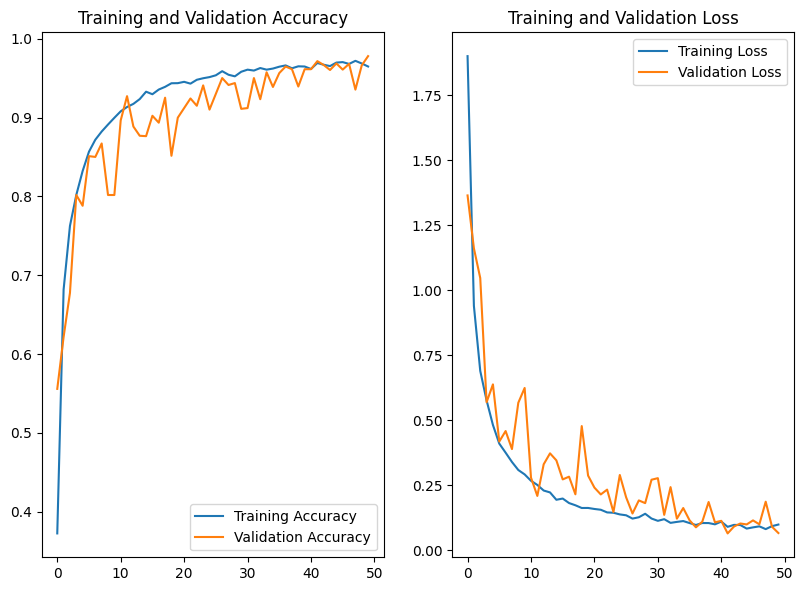

In [142]:
plt.figure(figsize = (15,15))
plt.subplot(2,3,1)
plt.plot(range(50), train_acc, label = 'Training Accuracy')
plt.plot(range(50), val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Training and Validation Accuracy') 

plt.subplot(2,3,2)
plt.plot(range(50), train_loss, label = 'Training Loss')
plt.plot(range(50), val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss')

2024-05-10 09:10:21.307379: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:208: Filling up shuffle buffer (this may take a while): 631 of 10000
2024-05-10 09:10:21.764662: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


Image of batch to predict :
Actual label :  Tomato_Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step
Predicted label :  Tomato_Late_blight


2024-05-10 09:10:22.741411: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


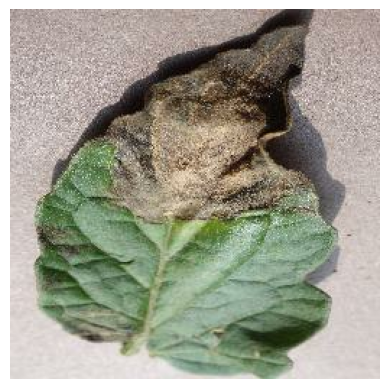

In [143]:
for image, label in train_data.take(1):
    temp_image = image[0].numpy().astype('uint8')
    temp_label = class_name[label[0]]
    
    print('Image of batch to predict :')
    plt.imshow(temp_image)
    print('Actual label : ', temp_label)
    
    batch_prediction = model.predict(image)
    print('Predicted label : ', class_name[np.argmax(batch_prediction[0])])
    plt.axis('off')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


2024-05-10 09:11:13.874467: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


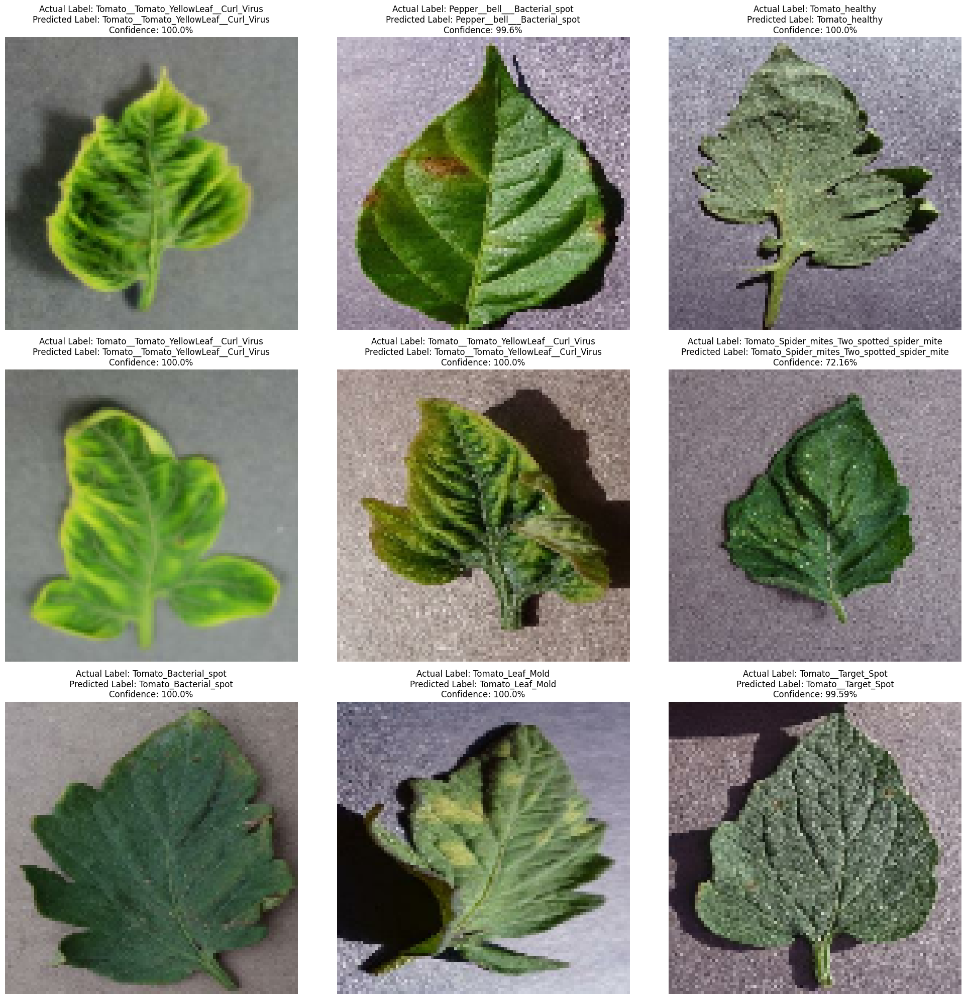

In [144]:
plt.figure(figsize=(20, 20))

# Assuming you want to process the first batch of images in the dataset
for i, (images, labels) in enumerate(train_data.take(1)):
    images_resized = tf.image.resize(images, (Image_Size, Image_Size))  # Resize the batch of images
    predictions_for_batch = model.predict(images_resized)  # Make predictions for the batch
    
    for j in range(9):  # Iterate over each image in the batch
        image_np = images_resized[j].numpy().astype('uint8')  # Convert image to numpy array and uint8 data type
        image_np = np.clip(image_np, 0, 255)  # Clip values to ensure they are within the valid range
        label = class_name[labels[j]]  # Get the corresponding label
        predicted_class = class_name[np.argmax(predictions_for_batch[j])]  # Get the predicted class
        confidence = round(np.max(predictions_for_batch[j]) * 100, 2)  # Calculate confidence
        
        # Calculate subplot index
        subplot_index = i * 3 + j + 1
        
        # Add subplot for the current image
        plt.subplot(3, 3, subplot_index)
        plt.imshow(image_np)  # Display the image
        plt.title(f'Actual Label: {label}\nPredicted Label: {predicted_class}\nConfidence: {confidence}%')
        plt.axis('off')

plt.tight_layout()
plt.show()

Saving Model

In [145]:
!mkdir -p saved_model
model.save('saved_model/plant_disease_healthy_model.keras')

Python(12211) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
